 # AUTOMATIC CHORD-SCALE DETECTION & STUDENT PERFORMANCE ASSESMENT FOR JAZZ IMPROVISATION 
 
 ## PART 3 : ANALYSIS ON MUSICCRITIC: SCALE EXERCISE 

In [ ]:
import sys,os
sys.path.append(os.path.join(os.path.dirname('__file__'), 'freesound-python/'))

from IPython.display import Audio
from IPython.core.display import display, HTML, Image

from utilities import *


#Directory for audio files
audioDir = 'audio/'
#Directory for audio segment annotations

annotationsDir = 'scale_annotations/'
#Directory for Feature Data (.csv and pickle files)
dataDir = 'data/'

#ANALYSIS PARAMETERS FOR FEATURE EXTRACTION

params=AnalysisParams(200,100,'hann',2048,44100,12)

#MUSICCRITIC ANALYSIS PARAMETERS

AUDIODIR = 'ScaleExercise_audio/'
if os.path.exists(AUDIODIR) != 1:
    os.mkdir(AUDIODIR)
FILEDIR = 'chord-scale_exercise/'

exercise = 'exercise.json'
IMAGEPATH = 'img/'
if os.path.exists(IMAGEPATH) != 1:
    os.mkdir(IMAGEPATH)

studentPerformances = []
for file in os.listdir(AUDIODIR):
    if not file.endswith('mix.mp3') :
        studentPerformances.append(file)
print(studentPerformances)        

In [ ]:
### FIRST, LET'S DEFINE A DICTIONARY THAT CONTAINS ALL THE PREDEFINED SCALE TEMPLATES

ScaleTemplates = dict()
    
ScaleTemplates['major'] = {'scaleArray':[1,0,1,0,1,1,0,1,0,1,0,1]}
ScaleTemplates['dorian'] = {'scaleArray':[1,0,1,1,0,1,0,1,0,1,1,0]}
ScaleTemplates['phrygian'] = {'scaleArray':[1,1,0,1,0,1,0,1,1,0,1,0]}
ScaleTemplates['lydian'] = {'scaleArray':[1,0,1,0,1,0,1,1,0,1,0,1]}
ScaleTemplates['mixolydian'] = {'scaleArray':[1,0,1,0,1,1,0,1,0,1,1,0]}
ScaleTemplates['minor'] = {'scaleArray':[1,0,1,1,0,1,0,1,1,0,1,0]}
ScaleTemplates['locrian'] = {'scaleArray':[1,1,0,1,0,1,1,0,1,0,1,0]}
ScaleTemplates['lydianb7'] = {'scaleArray':[1,0,1,0,1,0,1,1,0,1,1,0]}
ScaleTemplates['altered'] = {'scaleArray':[1,1,0,1,1,0,1,0,1,0,1,0]}
ScaleTemplates['mminor'] = {'scaleArray':[1,0,1,1,0,1,0,1,0,1,0,1]}
ScaleTemplates['hminor'] = {'scaleArray':[1,0,1,1,0,1,0,1,1,0,0,1]}
ScaleTemplates['hwdiminished'] = {'scaleArray':[1,1,0,1,1,0,1,1,0,1,1,0]}
ScaleTemplates['wholetone'] = {'scaleArray':[1,0,1,0,1,0,1,0,1,0,1,0]}
ScaleTemplates['chromatic'] = {'scaleArray':[1,1,1,1,1,1,1,1,1,1,1,1]}

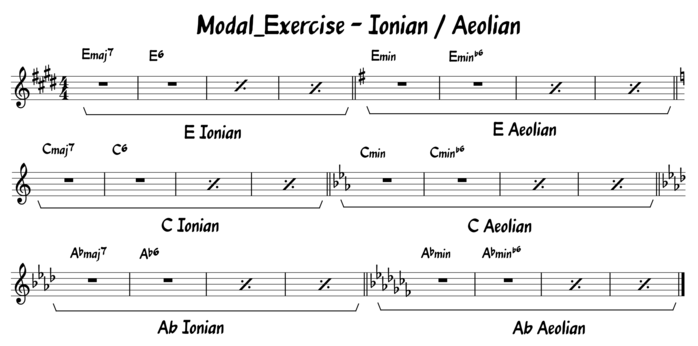

In [3]:
Image(filename = IMAGEPATH + "scalesexercise.png", width=700, height=700)

In [8]:
FILENAME = os.path.join(AUDIODIR, '868.wav')
EXERCISEFILE = os.path.join(FILEDIR,exercise)
Audio(FILENAME, rate = params.fs)

#### FEATURE EXTRACTION 

In [9]:
FEATURES_DATA = FeatureExtraction_single(FILENAME,params,EXERCISEFILE)

#### ANALYSIS ON SEPERATED REGIONS OF THE EXERCISE

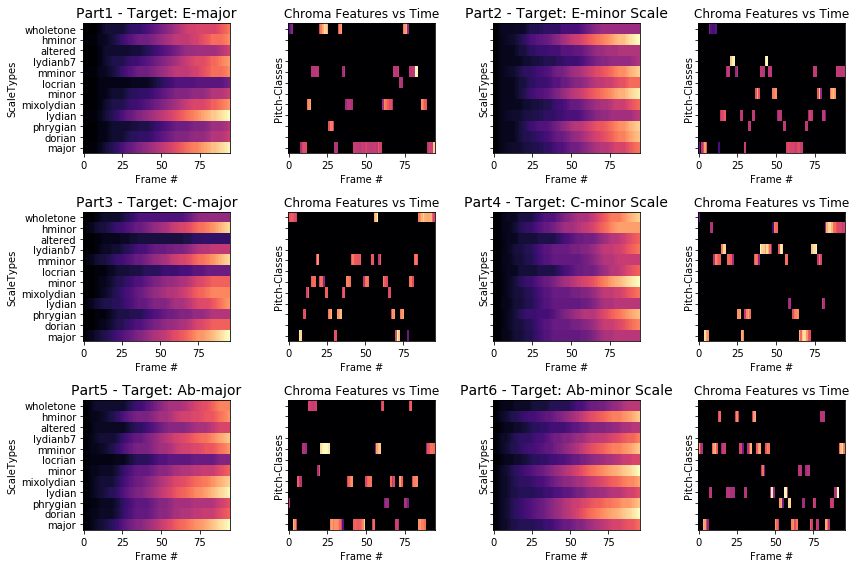

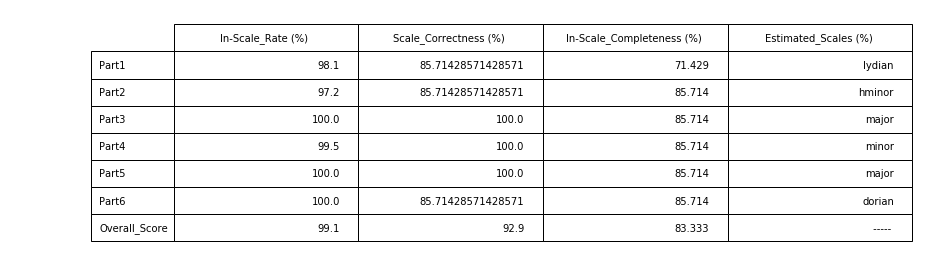

In [10]:
GRADES = []
GRADES.append(['PARTS', ('In-Scale_Rate', 'Scale_Correctness','In-Scale_Completeness')])
ANALYSIS_DATA = []    
ESTIMATEDSCALES = []
for i in range(len(FEATURES_DATA)):
    PartData = FEATURES_DATA['Part'+str(i+1)]    
    LikeliestScale, likelihoods = SegmentAnalysis(PartData,ScaleTemplates)  
    GRADES.append(['Part'+str(i+1),PerformanceAssessment(PartData,LikeliestScale,ScaleTemplates)])
    ESTIMATEDSCALES.append(LikeliestScale)

    ANALYSIS_DATA.append(likelihoods)
    
VisualizePerformance(ANALYSIS_DATA, FEATURES_DATA)
        
FINALGRADES = exerciseAssessment(FILENAME,EXERCISEFILE,0)
GRADES.append(['Overall_Score',FINALGRADES])
plot_tableGRADES(GRADES,ESTIMATEDSCALES)

In [7]:
partNo = '2'
SEGMENT_start, SEGMENT_end = FEATURES_DATA['Part'+partNo]['startTime'], FEATURES_DATA['Part'+partNo]['endTime'] #### select the part to hear for manual evaluation of the grading

audioSegment = SegmentExerciseAudio(FILENAME,SEGMENT_start,SEGMENT_end,params)
Audio(audioSegment, rate = params.fs)